# Game2Vec
The notebook is about the prototype version of the project within recommender systems.
The notebook is divided into 4 segments:
- data preparation 
- creation and learning of the model
- application of the model to compute representations for games and creation of a simple system for recommendation
- PCA analysis 

###  Load the libraries you need

In [77]:
import json
import pandas as pd
import numpy as np
import torch
import re
from datetime import datetime
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset
import torch.optim as optim
import torch.nn as nn
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.preprocessing import StandardScaler

## Data Preparation
Data loaded from a file downloaded directly from the kaggle platform a collection of approximately 80000 games

In [27]:
df = pd.read_json("data/final_data_new.json")
df = df.drop_duplicates(subset=["date","developer","publisher","name"])
df.head()

,img_url,date,developer,publisher,full_desc,requirements,popu_tags,price,url_info,name,categories,pegi
0,https://steamcdn-a.akamaihd.net/steam/apps/945...,"Nov 16, 2018",Innersloth,Innersloth,"{'sort': 'game', 'desc': 'About This Game Play...",{'minimum': {'windows': {'processor': ' SSE2 i...,"[Multiplayer, Online, Space, Social, Deduction...",499,{'url': 'https://store.steampowered.com/app/94...,Among Us,"[Online PvPLAN, PvPOnline Co-opLAN, Co-opCross...",NaN
1,https://steamcdn-a.akamaihd.net/steam/apps/730...,"Aug 21, 2012","Valve, Hidden Path Entertainment",Valve,"{'sort': 'game', 'desc': 'About This Game Coun...",{'minimum': {'windows': {'processor': ' Intel®...,"[Shooter, Multiplayer, Competitive, Action, Te...",free,{'url': 'https://store.steampowered.com/app/73...,Counter-Strike: Global Offensive,"[Steam Achievements Full, controller supportSt...",NaN
2,https://steamcdn-a.akamaihd.net/steam/apps/109...,"Aug 3, 2020",Mediatonic,Devolver Digital,"{'sort': 'game', 'desc': 'About This Game Fall...",{},"[Multiplayer, Funny, Battle, Royale, Online, F...",199,{'url': 'https://store.steampowered.com/app/10...,Fall Guys: Ultimate Knockout,"[MMOOnline PvPOnline, Co-opSteam Achievements ...",NaN
3,https://steamcdn-a.akamaihd.net/steam/apps/115...,"Sep 1, 2020",Paradox Development Studio,Paradox Interactive,"{'sort': 'game', 'desc': 'About This Game Para...",{},"[Strategy, Simulation, Medieval, Grand, Strate...",499,{'url': 'https://store.steampowered.com/app/11...,Crusader Kings III,"[Single-playerOnline PvPSteam, Achievements St...",{'pegi_url': 'https://steamstore-a.akamaihd.ne...
4,https://steamcdn-a.akamaihd.net/steam/apps/108...,"Oct 1, 2019",Bungie,Bungie,"{'sort': 'game', 'desc': 'About This Game Dive...",{},"[Free, Play, Looter, Shooter, Multiplayer, Act...",free,{'url': 'https://store.steampowered.com/app/10...,Destiny 2,"[Single-playerOnline PvPOnline, Co-opSteam Ach...",{'pegi_url': 'https://steamstore-a.akamaihd.ne...


### Take only useful columns

In [28]:
selected_df = df[['date', 'developer', 'publisher', 'full_desc','popu_tags', 'price', 'name', 'categories','pegi']]
selected_df.head()

,date,developer,publisher,full_desc,popu_tags,price,name,categories,pegi
0,"Nov 16, 2018",Innersloth,Innersloth,"{'sort': 'game', 'desc': 'About This Game Play...","[Multiplayer, Online, Space, Social, Deduction...",499,Among Us,"[Online PvPLAN, PvPOnline Co-opLAN, Co-opCross...",NaN
1,"Aug 21, 2012","Valve, Hidden Path Entertainment",Valve,"{'sort': 'game', 'desc': 'About This Game Coun...","[Shooter, Multiplayer, Competitive, Action, Te...",free,Counter-Strike: Global Offensive,"[Steam Achievements Full, controller supportSt...",NaN
2,"Aug 3, 2020",Mediatonic,Devolver Digital,"{'sort': 'game', 'desc': 'About This Game Fall...","[Multiplayer, Funny, Battle, Royale, Online, F...",199,Fall Guys: Ultimate Knockout,"[MMOOnline PvPOnline, Co-opSteam Achievements ...",NaN
3,"Sep 1, 2020",Paradox Development Studio,Paradox Interactive,"{'sort': 'game', 'desc': 'About This Game Para...","[Strategy, Simulation, Medieval, Grand, Strate...",499,Crusader Kings III,"[Single-playerOnline PvPSteam, Achievements St...",{'pegi_url': 'https://steamstore-a.akamaihd.ne...
4,"Oct 1, 2019",Bungie,Bungie,"{'sort': 'game', 'desc': 'About This Game Dive...","[Free, Play, Looter, Shooter, Multiplayer, Act...",free,Destiny 2,"[Single-playerOnline PvPOnline, Co-opSteam Ach...",{'pegi_url': 'https://steamstore-a.akamaihd.ne...


## Clearing columns
- 'full_desc' column taking only game description
- 'price' column changed from  values'free' to 0
- 'date' column changed to game age as int counting from 2022
- Column 'pegs' if present then 1 if not then 0

In [29]:
def get_desc(row):
    if type(row) == dict and 'desc' in row.keys():
        return row['desc']
    else:
        None

In [30]:
selected_df['full_desc'] = selected_df['full_desc'].apply(lambda x: get_desc(x))

C:\Users\fdrew\AppData\Local\Temp/ipykernel_12448/3460203742.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [31]:
def get_year(row):
    try:
        dt = datetime.strptime(row, '%b %d, %Y')
        return str(2022-int(dt.year))
    except:
        return 0
    

In [32]:
selected_df['date'] = selected_df['date'].apply(lambda x: get_year(x))

C:\Users\fdrew\AppData\Local\Temp/ipykernel_12448/1509854751.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [33]:
def get_price(row):
    try:
        if row == 'free':
            return 0
        else:
            return row
    except:
        return 0

In [34]:
selected_df['price'] = selected_df['price'].apply(lambda x: get_price(x))

C:\Users\fdrew\AppData\Local\Temp/ipykernel_12448/949762563.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [35]:
def get_pegi(row):
    try:
        if row and 'age_limit' in row:
            return 1
        else:
            return 1
    except:
        return 0

In [36]:
selected_df['pegi'] = selected_df['pegi'].apply(lambda x: get_pegi(x))

C:\Users\fdrew\AppData\Local\Temp/ipykernel_12448/3419359194.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Cleaning columns with genre tags

In [37]:
def clean(list_to_clen):
    big_c = []
    for elem in list_to_clen:
        if type(elem) == list:
            big_c.extend(elem)
        else:
            big_c.append(elem)
    u_big_c = list(set(big_c))
    return u_big_c

In [38]:
def recurention_search(word, tags, tags_m1):
    find_tags = []
    if len(word) > 0:
        for index in range(len(word)+1):
            #print(word[:index])
            if word[:index] in tags or (index == len(word) and (word[:index +1] in tags or word[:index] in tags_m1)):
                find_tags.extend([word[:index]]+ recurention_search(word[index:],tags, tags_m1))
                return find_tags
    return []

In [39]:
def check_in_tags(word, tags):
    tags_part = []
    word = word.replace('+', '')
    for elem in tags:
        if word in elem:
            tags_part.append(elem)
    return tags_part

In [40]:
def clean_tags(row, tags, tags_m1):
    cleaned = []
    if type(row)==list:
        for tag in row:            
            if tag in tags:
                cleaned.append(tag)
            elif tag[:-1] in tags:
                cleaned.append(tag[:-1])
                if tag[-1] == '2':
                    cleaned.append('2D')
                elif tag[-1] == '3':
                    cleaned.append('3D')
                elif tag[-1] == '4':
                    cleaned.append('4X')
                elif tag[-1] == '6':
                    cleaned.append('6DOF')
            elif len(tag) > 1 and tag[:-2] in tags:
                cleaned.append(tag[:-2])
                if tag[-2] == '2.':
                    cleaned.append('2.5D')
            elif type(tag)==str and len(tag) > 2:
                found_tags =  check_in_tags(tag, tags)
                if not found_tags:
                    cleaned.extend(recurention_search(tag,tags,tags_m1))
                else:
                    cleaned.extend(found_tags)
            else:
                cleaned.append(tag)
    elif row == 2:
        cleaned.append('2D')
    elif row == 3:
        cleaned.append('3D')
    elif row == 4:
        cleaned.append('4X')
    elif row == 6:
        cleaned.append('6DOF')
    else:
        cleaned.append(row)
    return list(set(cleaned))

In [94]:
#TESTS
word = "Soundtrack1980s1990'"
tags = ["Soundtrack","1980s","1990's"]
tags_m1 = ["Soundtrac","1980","1990'"]
check = recurention_search(word,tags, tags_m1)
assert check == ['Soundtrack', '1980s', "1990'"]

In [48]:
tag_list = []
with open('taglist.txt', 'r') as fp:
    Lines = fp.readlines()
    for ii, line in enumerate(Lines):
            tag_list.append(line[:-1])

In [49]:
tags_m1 = [x[-1] for x in tag_list if len(x) > 1]
selected_df['popu_tags'] = selected_df['popu_tags'].apply(lambda x: clean_tags(x, tag_list, tags_m1))

C:\Users\fdrew\AppData\Local\Temp/ipykernel_12448/2304515022.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [50]:
tag_new_list = selected_df['popu_tags'].to_list()

In [51]:
len(clean(tag_new_list))

389

#### All used genre tags in dataset

In [95]:
#clean(tag_new_list)

In [152]:
selected_df.head()

,date,developer,publisher,full_desc,popu_tags,price,name,categories,pegi
0,4,Innersloth,Innersloth,About This Game Play with 4-10 player online o...,"[Social Deduction, Multiplayer, Local Co-Op, M...",499,Among Us,"[Online PvPLAN, PvPOnline Co-opLAN, Co-opCross...",0
1,10,"Valve, Hidden Path Entertainment",Valve,About This Game Counter-Strike: Global Offensi...,"[Team-Based, Action, First-Person, Sports, Tac...",0,Counter-Strike: Global Offensive,"[Steam Achievements Full, controller supportSt...",0
2,2,Mediatonic,Devolver Digital,About This Game Fall Guys: Ultimate Knockout f...,"[+, Auto Battler, GameMaker, Difficult, Multip...",199,Fall Guys: Ultimate Knockout,"[MMOOnline PvPOnline, Co-opSteam Achievements ...",0
3,2,Paradox Development Studio,Paradox Interactive,About This Game Paradox Development Studio bri...,"[Dating Sim, Nudity, Real-Time, Multiplayer, P...",499,Crusader Kings III,"[Single-playerOnline PvPSteam, Achievements St...",1
4,3,Bungie,Bungie,About This Game Dive into the world of Destiny...,"[First-Person, Multiplayer, Story Rich, Action...",0,Destiny 2,"[Single-playerOnline PvPOnline, Co-opSteam Ach...",1


### Fill missing values with 0

In [68]:
tag_dataset = selected_df[['date','popu_tags', 'price','pegi']].fillna(0)

In [69]:
tag_dataset

,date,popu_tags,price,pegi
0,4,"[Minigames, Survival, 2D, Social Deduction, Ca...",499,0
1,10,"[Fast-Paced, Action, Team-Based, Strategy, Spo...",0,0
2,2,"[Action, Difficult, Touch-Friendly, Soundtrack...",199,0
3,2,"[Time Travel, Dating Sim, Strategy, Adult Cont...",499,1
4,3,"[Action, Soundtrack, Third Person, First-Perso...",0,1
...,...,...,...,...
74802,0,"[Action, Team-Based, Music-Based Procedural Ge...",0,0
74803,0,"[Baseball, Action, Team-Based, Music-Based Pro...",0,0
74805,0,"[Team-Based, Music-Based Procedural Generation...",0,0
74806,0,"[Team-Based, Music-Based Procedural Generation...",0,0


#### One-Hot encoding for column with genre tags (popu_tags)

In [70]:
tag_dataset_of = tag_dataset.join(tag_dataset.popu_tags.str.join('|').str.get_dummies())

In [71]:
tag_dataset_of = tag_dataset_of.drop('popu_tags', 1)
tag_dataset_of[tag_dataset_of['price']==''] = 0

C:\Users\fdrew\AppData\Local\Temp/ipykernel_12448/3103220659.py:1: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



In [72]:
tag_dataset_of.columns

Index(['date', 'price', 'pegi', '&', ''', '+', '++', '-+', '-.', '.',
       ...
       'Warhammer 40K', 'Web Publishing', 'Well-Written', 'Werewolves',
       'Western', 'Word Game', 'World War I', 'World War II', 'Wrestling',
       'Zombies'],
      dtype='object', length=391)

In [73]:
tag_dataset_of = tag_dataset_of.drop('&', 1)
tag_dataset_of = tag_dataset_of.drop('\'', 1)
tag_dataset_of = tag_dataset_of.drop('+', 1)
tag_dataset_of = tag_dataset_of.drop('++', 1)
tag_dataset_of = tag_dataset_of.drop('-+', 1)
tag_dataset_of = tag_dataset_of.drop('-.', 1)
tag_dataset_of = tag_dataset_of.drop('.', 1)
tag_dataset_of.columns

C:\Users\fdrew\AppData\Local\Temp/ipykernel_12448/3746818598.py:1: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

C:\Users\fdrew\AppData\Local\Temp/ipykernel_12448/3746818598.py:2: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

C:\Users\fdrew\AppData\Local\Temp/ipykernel_12448/3746818598.py:3: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

C:\Users\fdrew\AppData\Local\Temp/ipykernel_12448/3746818598.py:4: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

C:\Users\fdrew\AppData\Local\Temp/ipykernel_12448/3746818598.py:5: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



Index(['date', 'price', 'pegi', '1980s', '1990's', '2D', '2D Fighter',
       '360 Video', '3D', '3D Fighter',
       ...
       'Warhammer 40K', 'Web Publishing', 'Well-Written', 'Werewolves',
       'Western', 'Word Game', 'World War I', 'World War II', 'Wrestling',
       'Zombies'],
      dtype='object', length=384)

In [29]:
tag_dataset_of.to_pickle("./dataset_tags.pkl")

## Preparing the train and test data

In [74]:
split_border = int(len(tag_dataset_of) * 0.8)
train_data = tag_dataset_of.iloc[:split_border].values.astype(np.float)
test_data = tag_dataset_of.iloc[split_border:].values.astype(np.float)

C:\Users\fdrew\AppData\Local\Temp/ipykernel_12448/2275984658.py:2: DeprecationWarning:

`np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

C:\Users\fdrew\AppData\Local\Temp/ipykernel_12448/2275984658.py:3: DeprecationWarning:

`np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



In [78]:
td_t = TensorDataset(torch.tensor(train_data).type(torch.FloatTensor), torch.zeros(len(train_data)).type(torch.FloatTensor))
td_d = TensorDataset(torch.tensor(test_data).type(torch.FloatTensor), torch.zeros(len(test_data)).type(torch.FloatTensor))

data_loader_train = DataLoader(td_t, 32)
data_loader_test = DataLoader(td_d, 32)

# Model Autoencoder

In [79]:
class Autoencoder(nn.Module):
    def __init__(self, in_shape):
        super().__init__()
        self.in_shape = in_shape
        self.encoder = nn.Sequential(
            nn.Linear(in_shape, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 12),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(12, 64),
            nn.ReLU(),
            nn.Linear(64, 128),
            nn.ReLU(),
            nn.Linear(128, in_shape),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

In [80]:
def validate(
    model: torch.nn.Module, 
    loss_fn: torch.nn.CrossEntropyLoss, 
    dataloader
):
    loss = 0
    all = 0
    for X_batch, _ in dataloader:
        y_pred = model(X_batch)
        all += len(y_pred)
        loss += loss_fn(y_pred, X_batch).sum()
    return loss / all

In [81]:
def train(model, optimizer, criterion,train_loader, test_loader,epochs=5,device='cpu'):
    losses_train = []
    losses_test = []
    current_loss = float('inf')
    early_stopping = 0
    for epoch in range(epochs):
        loss = 0
        model.train()
        for batch_features, _ in train_loader:
            # reshape mini-batch data to [N, 784] matrix
            # load it to the active device
            batch_features = batch_features.to(device)

            # reset the gradients back to zero
            # PyTorch accumulates gradients on subsequent backward passes

            # compute reconstructions
            outputs = model(batch_features)

            # compute training reconstruction loss
            train_loss = criterion(outputs, batch_features)

            # compute accumulated gradients
            train_loss.backward()

            # perform parameter update based on current gradients
            optimizer.step()
            optimizer.zero_grad()


            # add the mini-batch training loss to epoch loss
            loss += train_loss.item()

        # compute the epoch training loss
        model.eval()
        with torch.no_grad():
            
            loss_train_temp = validate(
              model=model, loss_fn=criterion, dataloader=train_loader)
            losses_train.append(loss_train_temp)
            
            loss_test_temp = validate(
              model=model, loss_fn=criterion, dataloader=test_loader)
            losses_test.append(loss_test_temp)
        
        # display the epoch training loss
        print("epoch : {}/{}, loss_train = {:.6f}, loss_dev = {:.6f}".format(epoch + 1, epochs, loss_train_temp,loss_test_temp))
        if loss_test_temp < current_loss:
            torch.save(model, "game_ae.ml")
            current_loss = loss_test_temp
            early_stopping = 0
        else:
            early_stopping += 1
        if early_stopping > 10:
            break
    return model, {'loss_train':losses_train,'loss_test':losses_test}

In [110]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# create a model from `AE` autoencoder class
# load it to the specified device, either gpu or cpu
model = Autoencoder(in_shape=384).to(device)

# create an optimizer object
# Adam optimizer with learning rate 1e-3
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# mean-squared error loss
criterion = nn.MSELoss()

learned, losses = train(model, optimizer, criterion, data_loader_train, data_loader_test, 100)


epoch : 1/100, loss_train = 17.292057, loss_dev = 1.873625
epoch : 2/100, loss_train = 17.291864, loss_dev = 1.873435
epoch : 3/100, loss_train = 17.291790, loss_dev = 1.873384
epoch : 4/100, loss_train = 17.291746, loss_dev = 1.873353
epoch : 5/100, loss_train = 17.291739, loss_dev = 1.873327
epoch : 6/100, loss_train = 17.291723, loss_dev = 1.873306
epoch : 7/100, loss_train = 17.291687, loss_dev = 1.873287
epoch : 8/100, loss_train = 17.291695, loss_dev = 1.873287
epoch : 9/100, loss_train = 17.291674, loss_dev = 1.873278
epoch : 10/100, loss_train = 17.291666, loss_dev = 1.873273
epoch : 11/100, loss_train = 17.291664, loss_dev = 1.873271
epoch : 12/100, loss_train = 17.291704, loss_dev = 1.873317
epoch : 13/100, loss_train = 17.291655, loss_dev = 1.873264
epoch : 14/100, loss_train = 17.291649, loss_dev = 1.873267
epoch : 15/100, loss_train = 17.291649, loss_dev = 1.873267
epoch : 16/100, loss_train = 17.291643, loss_dev = 1.873263
epoch : 17/100, loss_train = 17.291643, loss_dev 

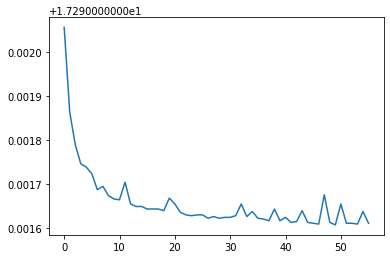

In [117]:
plt.plot(range(len(losses['loss_train'])),losses['loss_train'], label='train')
plt.show()

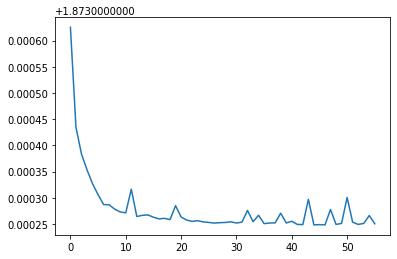

In [118]:
plt.plot(range(len(losses['loss_test'])),losses['loss_test'], label='dev')
plt.show()

In [82]:
#model.encoder(torch.tensor(tag_dataset_of.iloc[1].values.astype(np.float)).type(torch.FloatTensor))

In [156]:
hidden_representation = []
model.eval()
with torch.no_grad():
    for index in range(len(tag_dataset_of)):
        hidden_representation.append(model.encoder(torch.tensor(tag_dataset_of.iloc[index].values.astype(np.float)).type(torch.FloatTensor)).tolist())
    

C:\Users\fdrew\AppData\Local\Temp/ipykernel_7056/3151280678.py:5: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  hidden_representation.append(model.encoder(torch.tensor(tag_dataset_of.iloc[index].values.astype(np.float)).type(torch.FloatTensor)).tolist())


## Prepare data for recommendation in format: game name and representation

In [84]:
try:
    names_and_reps = pd.DataFrame(zip(hidden_representation,selected_df['name'].values.tolist()), columns=['representation','name'])
except:
    names_and_reps = pd.read_pickle("./names_and_reps.pkl")


In [85]:
names_and_reps

,representation,name
0,"[0.0, 4.6009907722473145, 8.021180152893066, 3...",Among Us
1,"[0.0, 6.605034351348877, 11.823169708251953, 1...",Counter-Strike: Global Offensive
2,"[0.0, 10.63432788848877, 6.384716033935547, 22...",Fall Guys: Ultimate Knockout
3,"[0.0, 15.32111644744873, 8.918519973754883, 13...",Crusader Kings III
4,"[0.0, 18.28046226501465, 12.900664329528809, 2...",Destiny 2
...,...,...
65473,"[0.0, 14.534379005432129, 16.088777542114258, ...",RIO - Raised In Oblivion
65474,"[0.0, 11.076231002807617, 14.109293937683105, ...",Polycalypse: Last bit of Hope
65475,"[0.0, 10.838829040527344, 7.672745704650879, 1...",Super Buckyball Tournament Preseason
65476,"[0.0, 10.931806564331055, 5.349940299987793, 6...",Lisa and the Grimoire


In [238]:
#names_and_reps.to_pickle("./names_and_reps.pkl")

In [89]:
def calculate_point(first_game, second_game, weight):
    result = [0]*len(first_game)

    for index in range(len(first_game)):
        difference_tmp = abs(first_game[index] - second_game[index])
        if first_game[index] > second_game[index]:
            result[index] = first_game[index] - (difference_tmp * (1-weight))
        elif first_game[index] < second_game[index]:
            result[index] = first_game[index] + (difference_tmp * (1-weight))
        else:
            result[index] = 0
    return result
        

In [90]:
def get_top_n(target,data, n, standarize=True):
    vals = data['representation'].values.tolist()
    target = [target]
    if standarize:
        ss = StandardScaler()
        vals = ss.fit_transform(vals)
        target = ss.transform(target)
    all_dist = euclidean_distances(vals,target)
    indexes = all_dist.flatten().argsort()[:n]
    games = []
    for ind in list(indexes):
        games.append((data['name'].iloc[ind], all_dist.flatten()[ind]))
    return games
    

In [91]:
def get_games(first_name, second_name, weight, data, n):
    try:
        first_game = data[data['name']==first_name]['representation'].values[0]
        second_game = data[data['name']==second_name]['representation'].values[0]
    except:
        print("No such games in dataset")
        return [()]
    game_in_space = calculate_point(first_game, second_game, weight)
    games = get_top_n(game_in_space, data, n)
    return games

In [102]:
get_games('Half-Life', 'Half-Life 2', 0.5, names_and_reps, 10)

[('Half-Life: Blue Shift', 0.8188765622169117),
 ('Unreal Gold', 0.8436074234872195),
 ('Half-Life: Opposing Force', 0.8694991959194626),
 ('Half-Life 2: Episode Two', 0.8754300549849254),
 ('Half-Life 2', 0.8925668079857485),
 ('Half-Life', 0.8925668079857565),
 ('Half-Life 2: Episode One', 0.9409337515152071),
 ('Half-Life: Source', 0.9934834309874327),
 ('Halo: Combat Evolved Anniversary', 1.4947516234631275),
 ('Caster', 1.5322874128372794)]

In [103]:
get_games('Counter-Strike: Global Offensive', 'Team Fortress 2', 0.5, names_and_reps, 10)

[('Team Fortress 2', 1.47057307069816),
 ('Counter-Strike: Global Offensive', 1.4705730706981623),
 ('Extopia', 1.7174249289213759),
 ('Combat Arms: Reloaded', 1.849582067982302),
 ('Games of Glory', 1.8700332202381613),
 ('Diamonds', 1.9381572278784471),
 ('Fortress Forever', 1.9510935855944136),
 ('Eximius: Seize the Frontline', 1.9712161078753097),
 ('Predecessor', 2.00113905402625),
 ('Streamline', 2.0234889477447378)]

# PCA analysis

In [93]:
from sklearn.decomposition import PCA

In [8]:
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(names_and_reps['representation'].values.tolist())
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])

In [9]:
finalDf = pd.concat([principalDf, names_and_reps['name']], axis = 1) 

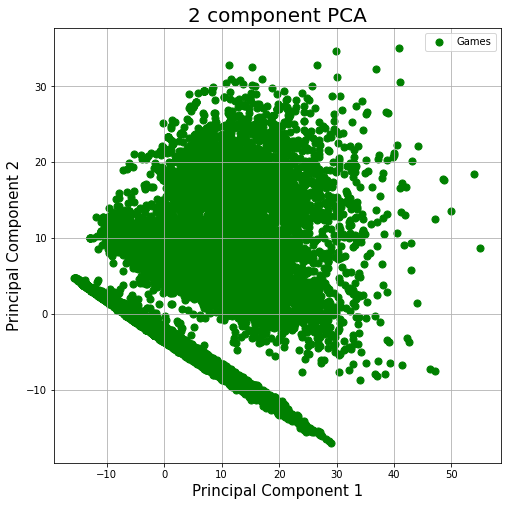

In [246]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = ['Games']
colors = ['g']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['principal component 2']
    ax.scatter(finalDf.loc[:, 'principal component 1']
               , finalDf.loc[:, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

## Bonus interactive data exploration

In [10]:
import plotly.express as px
fig = px.scatter(finalDf, x="principal component 1", y="principal component 2", hover_data=['name'])
fig.show()